In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
df_temp=pd.read_csv('E:/Bias_correction_ucl.csv',parse_dates=['Date'])
df_temp=pd.DataFrame(df_temp)
df_temp.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


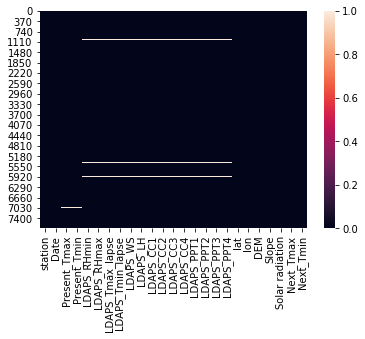

In [3]:
#checking for any missing data
sns.heatmap(df_temp.isnull())

In [4]:
df_temp.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [5]:
df_temp.dropna(inplace=True)

In [6]:
df_temp.isnull().sum()

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

In [7]:
#We can see there are no missing values in the dataset

In [8]:
df_temp['LDAPS_PPT2'].value_counts()

0.000000    5094
0.001953       7
0.000781       3
0.000040       3
0.000014       2
            ... 
0.085236       1
0.041993       1
0.002633       1
0.039292       1
4.211753       1
Name: LDAPS_PPT2, Length: 2479, dtype: int64

In [9]:
df_temp['LDAPS_CC1'].replace(float(0.000000) ,df_temp['LDAPS_CC1'].mean(),inplace=True)
df_temp['LDAPS_CC2'].replace(float(0.000000) ,df_temp['LDAPS_CC2'].mean(),inplace=True)
df_temp['LDAPS_CC3'].replace(float(0.000000) ,df_temp['LDAPS_CC3'].mean(),inplace=True)
df_temp['LDAPS_CC4'].replace(float(0.000000) ,df_temp['LDAPS_CC4'].mean(),inplace=True)
df_temp['LDAPS_PPT1'].replace(float(0.000000) ,df_temp['LDAPS_PPT1'].mean(),inplace=True)
df_temp['LDAPS_PPT2'].replace(float(0.000000) ,df_temp['LDAPS_PPT2'].mean(),inplace=True)
df_temp['LDAPS_PPT3'].replace(float(0.000000) ,df_temp['LDAPS_PPT3'].mean(),inplace=True)
df_temp['LDAPS_PPT4'].replace(float(0.000000) ,df_temp['LDAPS_PPT4'].mean(),inplace=True)

In [10]:
#checking data types
df_temp.dtypes
#We can see the attributes are in numerical form

station                    float64
Date                datetime64[ns]
Present_Tmax               float64
Present_Tmin               float64
LDAPS_RHmin                float64
LDAPS_RHmax                float64
LDAPS_Tmax_lapse           float64
LDAPS_Tmin_lapse           float64
LDAPS_WS                   float64
LDAPS_LH                   float64
LDAPS_CC1                  float64
LDAPS_CC2                  float64
LDAPS_CC3                  float64
LDAPS_CC4                  float64
LDAPS_PPT1                 float64
LDAPS_PPT2                 float64
LDAPS_PPT3                 float64
LDAPS_PPT4                 float64
lat                        float64
lon                        float64
DEM                        float64
Slope                      float64
Solar radiation            float64
Next_Tmax                  float64
Next_Tmin                  float64
dtype: object

In [11]:
#checking the basic info about the attributes and their counts
df_temp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7588 entries, 0 to 7749
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   station           7588 non-null   float64       
 1   Date              7588 non-null   datetime64[ns]
 2   Present_Tmax      7588 non-null   float64       
 3   Present_Tmin      7588 non-null   float64       
 4   LDAPS_RHmin       7588 non-null   float64       
 5   LDAPS_RHmax       7588 non-null   float64       
 6   LDAPS_Tmax_lapse  7588 non-null   float64       
 7   LDAPS_Tmin_lapse  7588 non-null   float64       
 8   LDAPS_WS          7588 non-null   float64       
 9   LDAPS_LH          7588 non-null   float64       
 10  LDAPS_CC1         7588 non-null   float64       
 11  LDAPS_CC2         7588 non-null   float64       
 12  LDAPS_CC3         7588 non-null   float64       
 13  LDAPS_CC4         7588 non-null   float64       
 14  LDAPS_PPT1        7588 n

In [12]:
#checking the maximum and minimum values of each attribute and their percentiles
df_temp.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,...,7588.000000,7588.000000,7588.000000,7588.000000,7588.00000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000
mean,13.014101,29.748366,23.195809,56.724969,88.360823,29.620128,23.511786,7.094097,62.492606,0.373561,...,0.803469,0.464808,0.464367,37.544792,126.99142,61.918136,1.259755,5343.724208,30.241526,22.910820
std,7.217858,2.967401,2.400880,14.626559,7.199456,2.943496,2.342579,2.177034,33.686158,0.258637,...,1.667289,1.106925,1.139816,0.050428,0.07922,54.323529,1.372748,429.782561,3.111807,2.482256
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000002,...,0.000014,0.000021,0.000017,37.456200,126.82600,12.370000,0.098500,4329.520508,17.400000,11.300000
25%,7.000000,27.800000,21.600000,45.960243,84.203724,27.673756,22.086820,5.675358,37.206201,0.156932,...,0.480738,0.275007,0.265373,37.510200,126.93700,28.700000,0.271300,5001.485717,28.200000,21.300000
50%,13.000000,29.900000,23.400000,55.023199,89.784122,29.709537,23.758249,6.547838,56.898324,0.326271,...,0.480738,0.275007,0.265373,37.550700,126.99500,45.716000,0.618000,5441.987305,30.400000,23.100000
75%,19.000000,32.000000,24.800000,67.115099,93.742725,31.711109,25.155660,8.028960,84.235666,0.574174,...,0.480738,0.275007,0.265373,37.577600,127.04200,59.832400,1.767800,5729.485840,32.600000,24.600000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,21.621661,15.841235,16.655469,37.645000,127.13500,212.335000,5.178200,5992.895996,38.900000,29.800000


# Univariate Analysis

In [13]:
df_temp.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

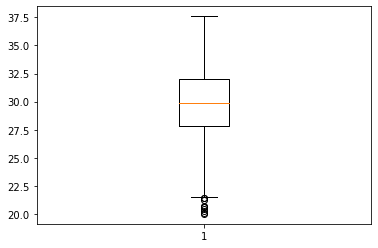

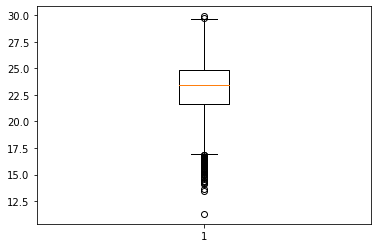

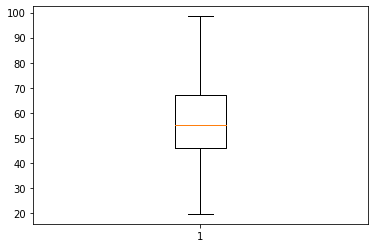

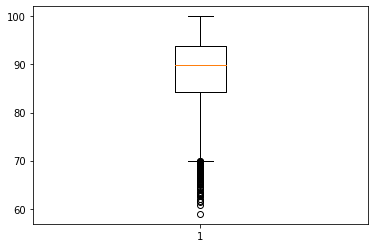

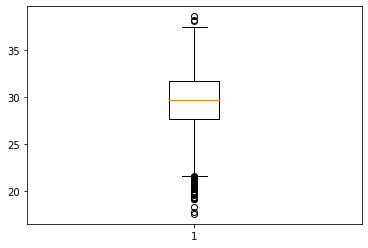

...

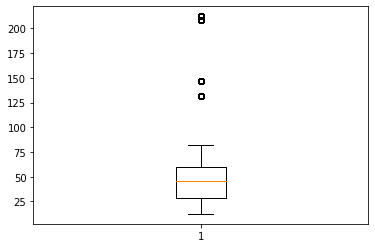

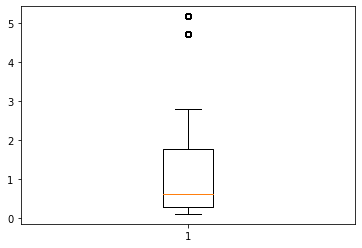

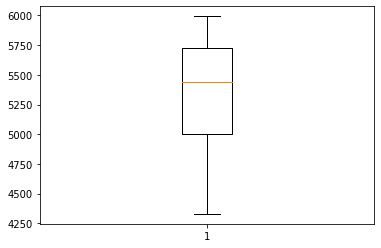

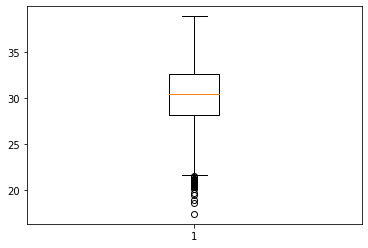

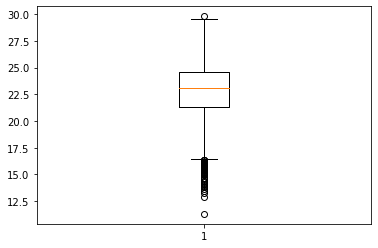

In [14]:
for i in ['Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin']:
    plt.boxplot(df_temp[i])
    plt.show()

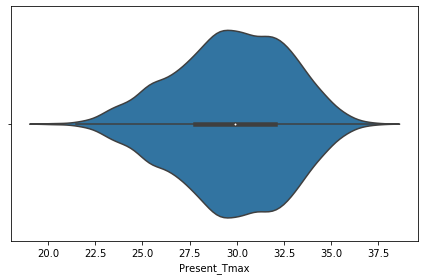

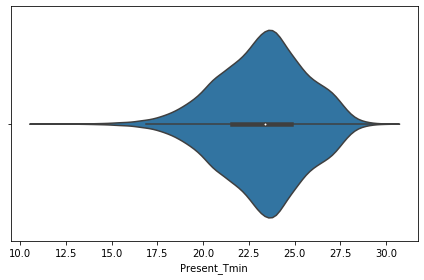

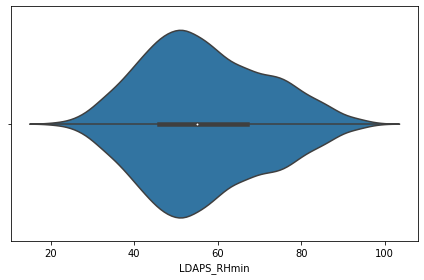

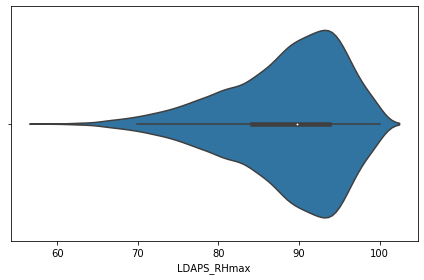

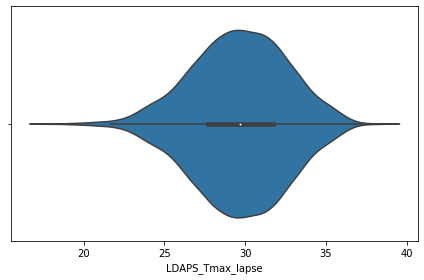

...

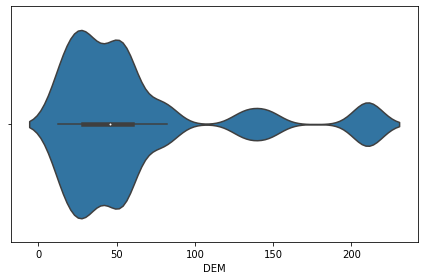

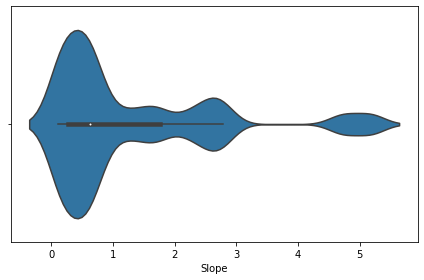

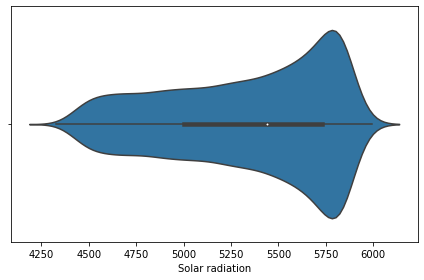

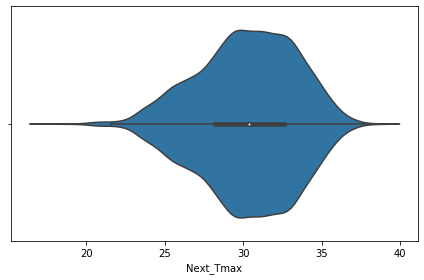

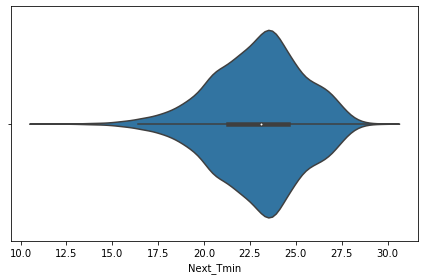

In [15]:
for i in ['Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin']:
    sns.violinplot(x=i,data=df_temp)
    plt.tight_layout()
    plt.show()

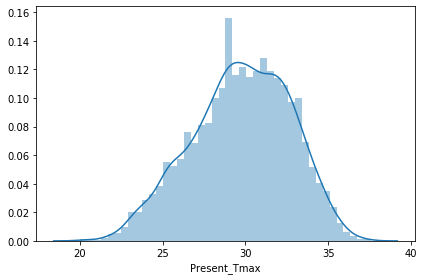

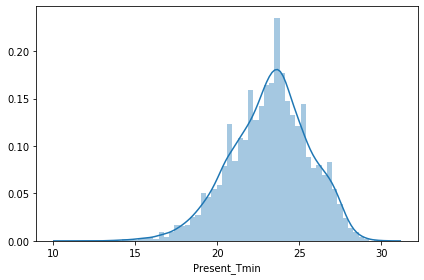

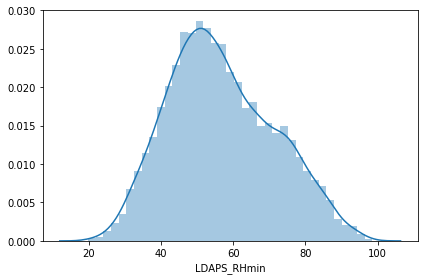

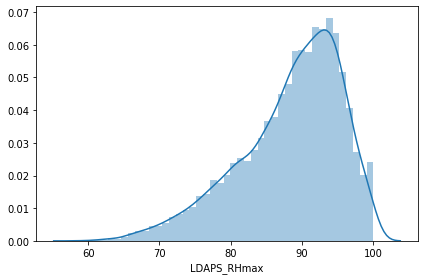

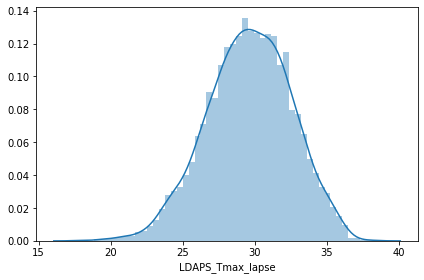

...

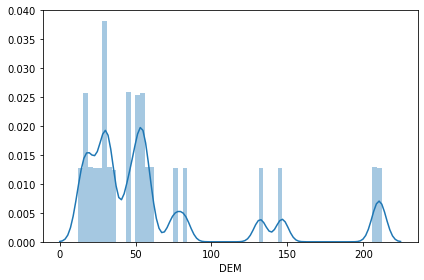

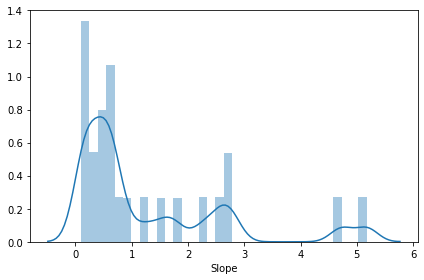

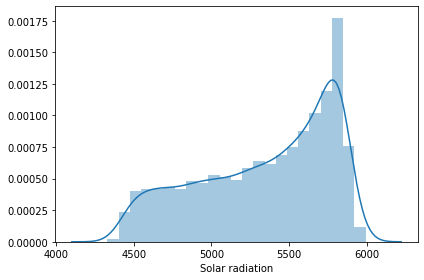

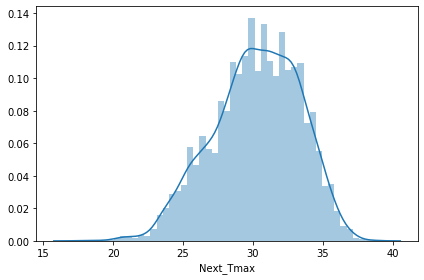

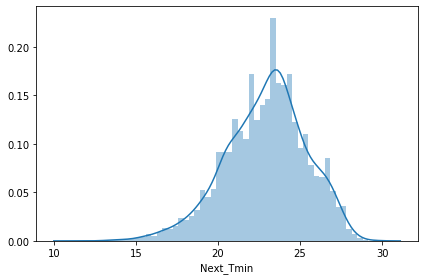

In [16]:
#Checking for the distribution of the data
for i in ['Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin']:
    sns.distplot(df_temp[i],bins='auto')
    plt.tight_layout()
    plt.show()

# Bivariate Analysis

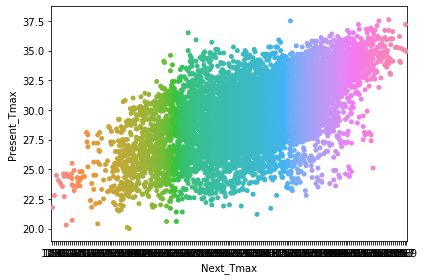

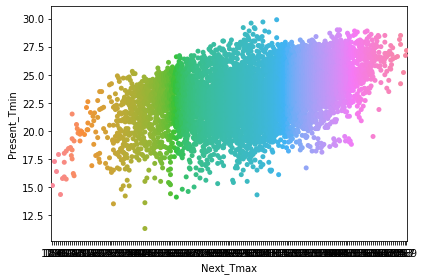

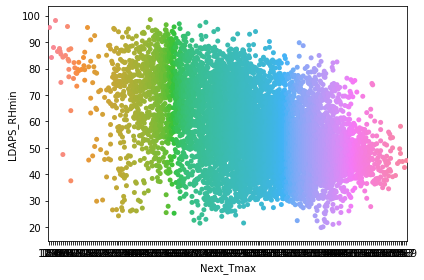

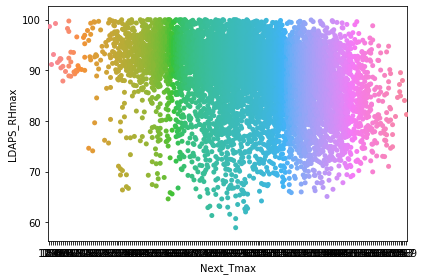

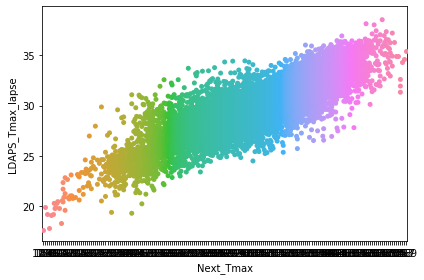

...

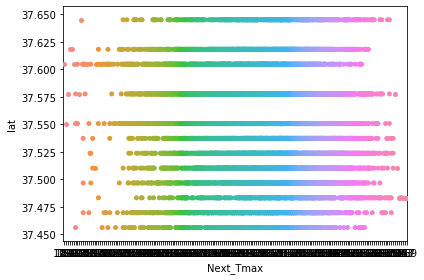

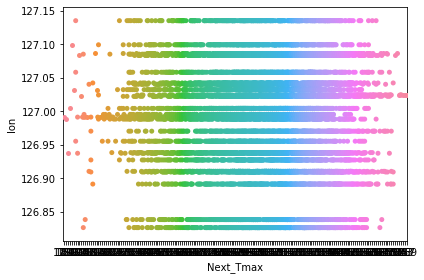

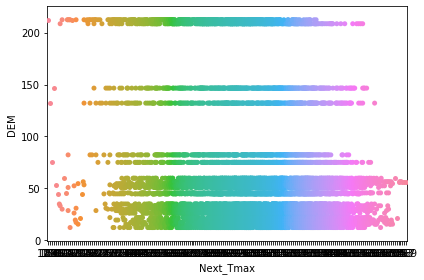

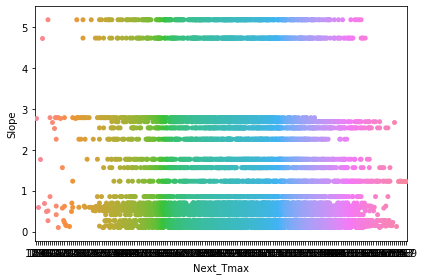

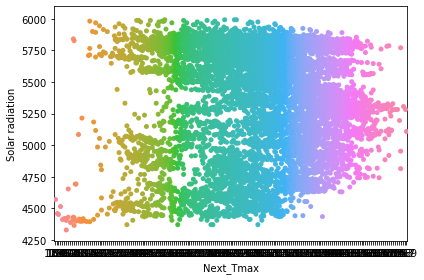

In [17]:
for i in ['Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation'] :
    sns.swarmplot(df_temp['Next_Tmax'],df_temp[i])
    plt.tight_layout()
    plt.show()

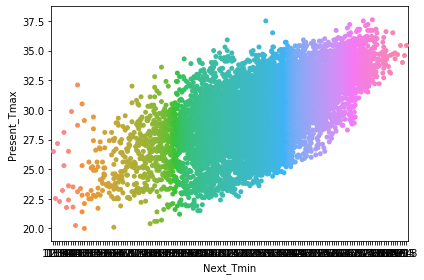

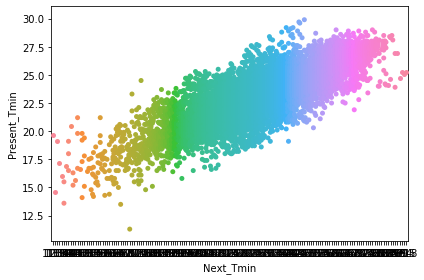

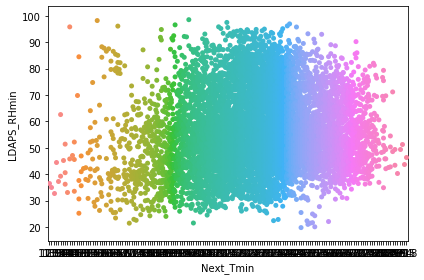

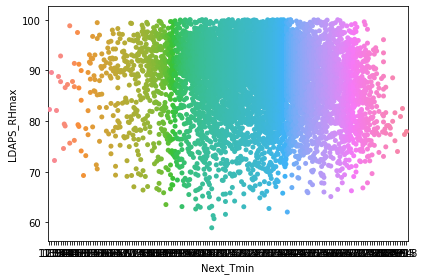

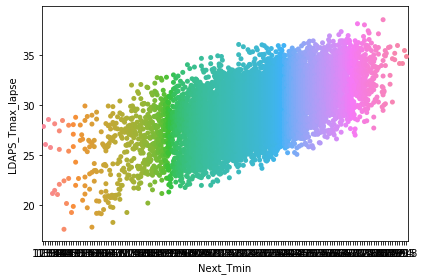

...

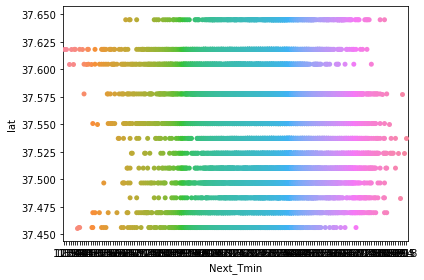

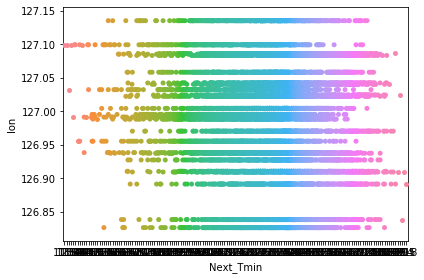

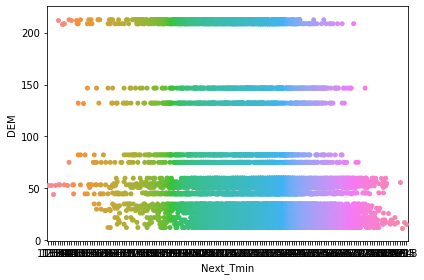

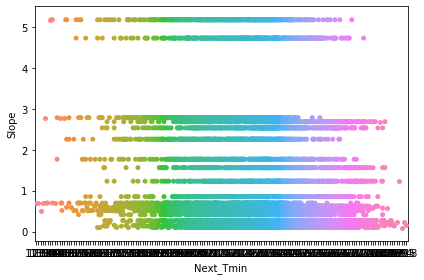

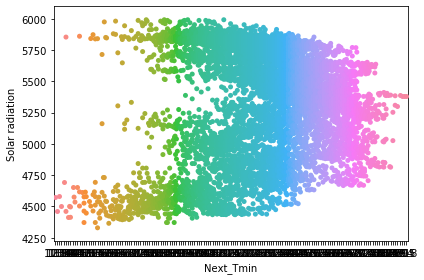

In [19]:
for i in ['Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation'] :
    sns.swarmplot(df_temp['Next_Tmin'],df_temp[i])
    plt.tight_layout()
    plt.show()

In [20]:
#Checking the correlation between the attributes
df_temp.corr()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
station,1.000000,0.113301,0.133282,-0.067846,-0.169351,0.069856,0.105277,0.005822,-0.132129,0.007243,...,-0.005434,-0.009890,-0.010755,-0.239118,-0.118845,-0.256706,-0.091721,-0.021194,0.107747,0.128184
Present_Tmax,0.113301,1.000000,0.615208,-0.209059,-0.306943,0.573777,0.628705,-0.125952,0.134246,-0.317544,...,-0.090586,-0.118039,-0.100399,-0.054134,0.007695,-0.189439,-0.107079,-0.022114,0.610357,0.621048
Present_Tmin,0.133282,0.615208,1.000000,0.122200,-0.018576,0.467904,0.772061,-0.038779,-0.012817,0.080174,...,0.054853,-0.054059,-0.063697,-0.081417,-0.045174,-0.254084,-0.148423,0.059765,0.463523,0.796975
LDAPS_RHmin,-0.067846,-0.209059,0.122200,1.000000,0.578358,-0.569580,0.085237,0.289422,-0.072195,0.600883,...,0.332743,0.189516,0.140092,0.085027,-0.077590,0.100684,0.122454,0.242168,-0.446824,0.093249
LDAPS_RHmax,-0.169351,-0.306943,-0.018576,0.578358,1.000000,-0.377293,-0.118965,0.131269,0.238986,0.418873,...,0.182177,0.102681,0.107686,0.194820,0.025563,0.176557,0.219436,0.146622,-0.289788,-0.076415
LDAPS_Tmax_lapse,0.069856,0.573777,0.467904,-0.569580,-0.377293,1.000000,0.653425,-0.316011,0.043663,-0.448317,...,-0.207721,-0.159183,-0.147404,-0.044052,0.091568,-0.181433,-0.163891,0.047414,0.835729,0.589963
LDAPS_Tmin_lapse,0.105277,0.628705,0.772061,0.085237,-0.118965,0.653425,1.000000,-0.134652,-0.139675,-0.012471,...,-0.005689,-0.090174,-0.094241,-0.099452,-0.024703,-0.198396,-0.187864,0.157763,0.592119,0.886513
LDAPS_WS,0.005822,-0.125952,-0.038779,0.289422,0.131269,-0.316011,-0.134652,1.000000,0.004427,0.287342,...,0.155318,0.132406,0.118280,0.033025,-0.063009,0.188540,0.169223,0.120630,-0.351107,-0.102021
LDAPS_LH,-0.132129,0.134246,-0.012817,-0.072195,0.238986,0.043663,-0.139675,0.004427,1.000000,-0.140168,...,-0.073917,0.018708,0.016238,0.133309,0.024476,0.056362,0.087517,-0.044956,0.156779,-0.060392
LDAPS_CC1,0.007243,-0.317544,0.080174,0.600883,0.418873,-0.448317,-0.012471,0.287342,-0.140168,1.000000,...,0.321405,0.132603,0.064768,-0.009498,-0.009406,-0.017084,-0.023690,0.205678,-0.466833,-0.032631


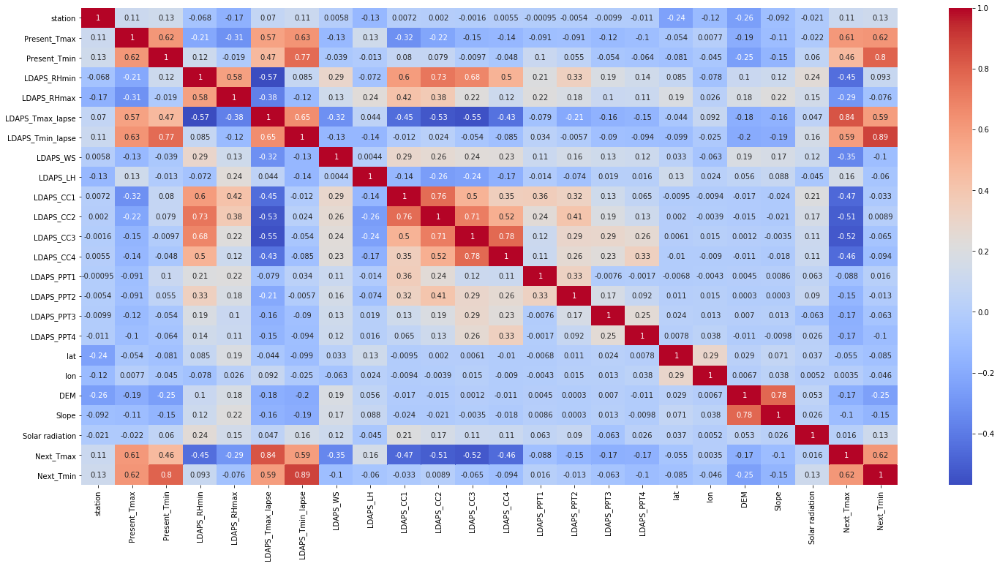

In [21]:
plt.figure(figsize=(25,12))
sns.heatmap(df_temp.corr(),cmap='coolwarm',annot=True)
plt.show()

In [14]:
df_temp.drop(['station', 'Date','lat', 'lon'],axis=1,inplace = True)

# Multivariate Analysis

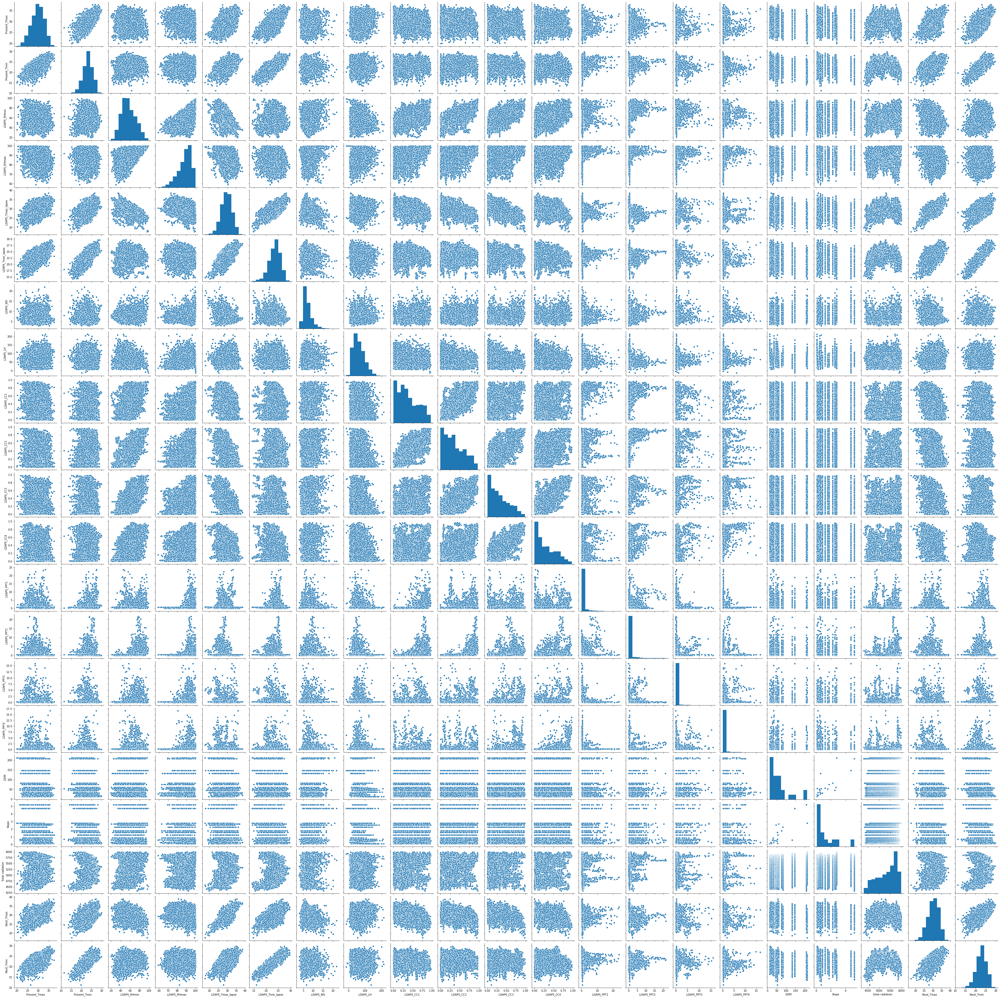

In [23]:
sns.pairplot(df_temp)

In [15]:
#Cheking the skewness of data
df_temp.skew()

Present_Tmax       -0.257069
Present_Tmin       -0.353822
LDAPS_RHmin         0.301396
LDAPS_RHmax        -0.845264
LDAPS_Tmax_lapse   -0.222349
LDAPS_Tmin_lapse   -0.574035
LDAPS_WS            1.553926
LDAPS_LH            0.662971
LDAPS_CC1           0.457229
LDAPS_CC2           0.473171
LDAPS_CC3           0.638238
LDAPS_CC4           0.656108
LDAPS_PPT1          5.578437
LDAPS_PPT2          5.955807
LDAPS_PPT3          6.546511
LDAPS_PPT4          6.886957
DEM                 1.721617
Slope               1.559050
Solar radiation    -0.524325
Next_Tmax          -0.334842
Next_Tmin          -0.393662
dtype: float64

In [16]:
#removing skewness using log transform
for col in df_temp.columns:
    if df_temp.skew().loc[col]>0.55:
        df_temp[col]=np.log1p(df_temp[col])

In [17]:
df_temp.skew()
#reduced skewness

Present_Tmax       -0.257069
Present_Tmin       -0.353822
LDAPS_RHmin         0.301396
LDAPS_RHmax        -0.845264
LDAPS_Tmax_lapse   -0.222349
LDAPS_Tmin_lapse   -0.574035
LDAPS_WS            0.681138
LDAPS_LH           -0.621184
LDAPS_CC1           0.457229
LDAPS_CC2           0.473171
LDAPS_CC3           0.383320
LDAPS_CC4           0.427199
LDAPS_PPT1          2.523379
LDAPS_PPT2          3.023894
LDAPS_PPT3          4.038768
LDAPS_PPT4          4.342141
DEM                 0.443612
Slope               0.833888
Solar radiation    -0.524325
Next_Tmax          -0.334842
Next_Tmin          -0.393662
dtype: float64

In [18]:
#removing outliers using zscore
from scipy.stats import zscore
zscore=np.abs(zscore(df_temp[['Slope','LDAPS_WS']])) #
print(zscore)
print(np.where(zscore>3))
df_temp_new=df_temp[(zscore<3).all(axis=1)]

[[1.30510263 0.01377849]
 [0.51031082 0.65419514]
 [0.86474459 0.38852679]
 ...
 [1.04603279 0.38236733]
 [0.93450393 0.16168194]
 [0.85662342 0.22659057]]
(array([  25,   44,  194,  341,  372,  391,  514,  564,  570,  589, 2135,
       2136, 2137, 2139, 2140, 2141, 2142, 2143, 2144, 2145, 2146, 2147,
       2148, 2149, 2150, 2151, 2153, 2154, 2155, 2157, 2158, 2159, 2313,
       2329, 2338, 2354, 2502, 3332, 3350, 3356, 3375, 3450, 3917, 4418,
       4434, 4708, 6035, 6051, 6057, 6058, 6060, 6065, 6066, 6076, 7179,
       7415, 7533], dtype=int64), array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int64))


In [19]:
print('Before removing outliers:',df_temp.shape)
print('After removing outliers:',df_temp_new.shape)

Before removing outliers: (7588, 21)
After removing outliers: (7531, 21)


In [20]:
df_temp_new

,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,...,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,2.056542,4.254929,0.233947,0.203896,...,0.123039,0.46311,0.392541,0.242951,0.235367,5.362864,1.331046,5992.895996,29.1,21.2
1,31.9,21.6,52.263397,90.604721,29.850689,24.035009,1.900896,3.969111,0.225508,0.251771,...,0.120204,0.46311,0.392541,0.242951,0.235367,3.823463,0.414821,5869.312500,30.5,22.5
2,31.6,23.3,48.690479,83.973587,30.091292,24.565633,1.965464,3.071445,0.209344,0.257469,...,0.132891,0.46311,0.392541,0.242951,0.235367,3.535344,0.235941,5863.555664,31.1,23.9
3,32.0,23.4,58.239788,96.483688,29.704629,23.326177,1.894624,4.200612,0.216372,0.226002,...,0.125970,0.46311,0.392541,0.242951,0.235367,3.844087,1.262657,5856.964844,31.7,24.3
4,31.4,21.9,56.174095,90.155128,29.113934,23.486480,1.907318,4.691032,0.151407,0.249995,...,0.157022,0.46311,0.392541,0.242951,0.235367,3.584574,0.409125,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,23.1,17.8,24.688997,78.261383,27.812697,18.303014,2.028576,2.362181,0.052902,0.030169,...,0.004370,0.46311,0.392541,0.242951,0.235367,3.306813,0.452412,4456.024414,27.6,17.7
7746,22.5,17.4,30.094858,83.690018,26.704905,17.814038,1.912218,4.420607,0.066461,0.024518,...,0.017523,0.46311,0.392541,0.242951,0.235367,3.134050,0.125045,4441.803711,28.0,17.1
7747,23.3,17.1,26.741310,78.869858,26.352081,18.775678,1.966961,4.291258,0.030034,0.081035,...,0.261031,0.46311,0.392541,0.242951,0.235367,2.808655,0.144447,4443.313965,28.3,18.1
7748,23.3,17.7,24.040634,77.294975,27.010193,18.733519,2.020596,3.876219,0.035874,0.074962,...,0.261031,0.46311,0.392541,0.242951,0.235367,2.906661,0.200734,4438.373535,28.6,18.8


In [31]:
#separating into input and output variables
df_x=df_temp_new.drop(columns=['Next_Tmax', 'Next_Tmin'])
y=pd.DataFrame(df_temp_new['Next_Tmax'])

In [32]:
df_x.shape

(7531, 19)

In [33]:
y.shape

(7531, 1)

In [34]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=sc.fit_transform(df_x)
x=pd.DataFrame(x,columns=df_x.columns)

In [37]:
x.replace([np.inf, -np.inf], np.nan, inplace=True)

In [38]:
x.isnull().sum()

Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            2
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
DEM                 0
Slope               0
Solar radiation     0
dtype: int64

In [39]:
x.drop(['LDAPS_LH'],axis=1,inplace = True)

In [40]:
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
from sklearn.model_selection import train_test_split
def maxr2_score(regr,x,y):
    max_r_score=0
    for r_state in range(42,100):
        x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=r_state,test_size=0.20)
        regr.fit(x_train,y_train)
        y_pred=regr.predict(x_test)
        r2_scr=r2_score(y_test,y_pred)
        print("r2 score corresponding to",r_state,"is",r2_scr)
        if r2_scr>max_r_score:
            max_r_score=r2_scr
            final_r_state=r_state
    print("max r2 score corresponding to",final_r_state,"is",max_r_score)    
    return final_r_state

In [41]:
#Using LinearRegression and checking maxr2 score corresponding to different random states
from sklearn.linear_model import LinearRegression
lreg=LinearRegression()
r_state=maxr2_score(lreg,x,y)

r2 score corresponding to 42 is 0.7847005510213894
r2 score corresponding to 43 is 0.7771731352103641
r2 score corresponding to 44 is 0.7720076263749285
r2 score corresponding to 45 is 0.7751124061342151
r2 score corresponding to 46 is 0.762637331391986
r2 score corresponding to 47 is 0.7824259721954807
r2 score corresponding to 48 is 0.7729379018556675
r2 score corresponding to 49 is 0.7677177069514579
r2 score corresponding to 50 is 0.7506087146264719
r2 score corresponding to 51 is 0.7597626788045957
r2 score corresponding to 52 is 0.7687874699812518
r2 score corresponding to 53 is 0.7678769588739153
r2 score corresponding to 54 is 0.7465245758174446
r2 score corresponding to 55 is 0.7734840077352705
r2 score corresponding to 56 is 0.7573928472711978
r2 score corresponding to 57 is 0.775963705077098
r2 score corresponding to 58 is 0.7720430249654912
r2 score corresponding to 59 is 0.778781834056227
r2 score corresponding to 60 is 0.7707965057120134
r2 score corresponding to 61 is 0.

In [42]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
neighbors={'n_neighbors':range(1,26)}
knr=KNeighborsRegressor()
gknr=GridSearchCV(knr,neighbors,cv=10)
gknr.fit(x,y)
gknr.best_params_

{'n_neighbors': 25}

In [43]:
#using KNN regression and checking max r2 score corresponding to different random states
knr=KNeighborsRegressor(n_neighbors=25)
r_state=maxr2_score(knr,x,y)

r2 score corresponding to 42 is 0.850675975063778
r2 score corresponding to 43 is 0.8509123011433982
r2 score corresponding to 44 is 0.845773178449476
r2 score corresponding to 45 is 0.8386825754556896
r2 score corresponding to 46 is 0.845107853959261
r2 score corresponding to 47 is 0.8428464574337915
r2 score corresponding to 48 is 0.8459566946976906
r2 score corresponding to 49 is 0.8389344289971656
r2 score corresponding to 50 is 0.8274583189132991
r2 score corresponding to 51 is 0.8513732482385145
r2 score corresponding to 52 is 0.8487690898604985
r2 score corresponding to 53 is 0.8454487226182911
r2 score corresponding to 54 is 0.8384780076394087
r2 score corresponding to 55 is 0.8467018899987377
r2 score corresponding to 56 is 0.8425296577761611
r2 score corresponding to 57 is 0.8512278405656561
r2 score corresponding to 58 is 0.8491956928191919
r2 score corresponding to 59 is 0.8490500110809135
r2 score corresponding to 60 is 0.8420185508032074
r2 score corresponding to 61 is 0.

In [44]:
#checking the mean r2 score of both Linear Regression Model and KNN Regression
from sklearn.model_selection import cross_val_score
print('Mean r2 score for Linear Regression:',cross_val_score(lreg,x,y,cv=5,scoring='r2').mean())
print('Standard Deviation in r2 score for Linear Regression:',cross_val_score(lreg,x,y,cv=5,scoring='r2').std())
print()
print("Mean r2 score for KNN Regression:",cross_val_score(knr,x,y,cv=5,scoring='r2').mean())
print('Standard Deviation in r2 score for KNN Regression:',cross_val_score(knr,x,y,cv=5,scoring='r2').std())
#Based on below output Linear Regression is performing well

Mean r2 score for Linear Regression: 0.7060272607484441
Standard Deviation in r2 score for Linear Regression: 0.05391148254830039

Mean r2 score for KNN Regression: 0.594102297116228
Standard Deviation in r2 score for KNN Regression: 0.08757124458616458


In [45]:
#Checking lasso Regression and finding best value for alpha
from sklearn.linear_model import Lasso
lsreg=Lasso()
parameters={"alpha":[0.0001,0.001,0.01,0.1,1]}
clf=GridSearchCV(lsreg,parameters,cv=10)
clf.fit(x,y)
clf.best_params_

{'alpha': 0.01}

In [46]:
#Checking max r2 score when we use Lasso
lsreg=Lasso(alpha=0.01)
r_state=maxr2_score(lsreg,x,y)

r2 score corresponding to 42 is 0.7843277664580581
r2 score corresponding to 43 is 0.7775409226289894
r2 score corresponding to 44 is 0.7706083721146746
r2 score corresponding to 45 is 0.7746549055399506
r2 score corresponding to 46 is 0.7621013133627352
r2 score corresponding to 47 is 0.7820819448426137
r2 score corresponding to 48 is 0.7728990537267381
r2 score corresponding to 49 is 0.7669742821319745
r2 score corresponding to 50 is 0.7501319973607995
r2 score corresponding to 51 is 0.7596198854627696
r2 score corresponding to 52 is 0.768062851367441
r2 score corresponding to 53 is 0.7668529119839561
r2 score corresponding to 54 is 0.7455984235964028
r2 score corresponding to 55 is 0.7728720775386225
r2 score corresponding to 56 is 0.7574873625054013
r2 score corresponding to 57 is 0.7756843102170782
r2 score corresponding to 58 is 0.772156108026873
r2 score corresponding to 59 is 0.7782790692722936
r2 score corresponding to 60 is 0.7703804443648576
r2 score corresponding to 61 is 0

In [47]:
#Using cross val score with lasso
print("Mean r2 score for Lasso Regression:",cross_val_score(lsreg,x,y,cv=5,scoring='r2').mean())
print('Standard Deviation in r2 score for Lasso Regression:',cross_val_score(lsreg,x,y,cv=5,scoring='r2').std())

Mean r2 score for Lasso Regression: 0.7068983040969273
Standard Deviation in r2 score for Lasso Regression: 0.05483825769149419


In [48]:
#Checking Ridge regression and finding best value for alpha
from sklearn.linear_model import Ridge
rdreg=Ridge()
parameters={"alpha":[0.001,0.01,0.1,1]}
clf=GridSearchCV(rdreg,parameters,cv=10)
clf.fit(x,y)
clf.best_params_

{'alpha': 1}

In [49]:
#Checking max r2 score when we use Ridge
rdreg=Ridge(alpha=1)
r_state=maxr2_score(rdreg,x,y)

r2 score corresponding to 42 is 0.7846939368652273
r2 score corresponding to 43 is 0.7771827464933161
r2 score corresponding to 44 is 0.7720103179606792
r2 score corresponding to 45 is 0.775105615304088
r2 score corresponding to 46 is 0.76264354276887
r2 score corresponding to 47 is 0.7824290177327051
r2 score corresponding to 48 is 0.7729358036143267
r2 score corresponding to 49 is 0.7677004810344985
r2 score corresponding to 50 is 0.7506061979479779
r2 score corresponding to 51 is 0.7597611002330897
r2 score corresponding to 52 is 0.7687912644628178
r2 score corresponding to 53 is 0.7678712580406359
r2 score corresponding to 54 is 0.746528244014988
r2 score corresponding to 55 is 0.7734689138081767
r2 score corresponding to 56 is 0.757406993342306
r2 score corresponding to 57 is 0.7759524854805118
r2 score corresponding to 58 is 0.772061379700373
r2 score corresponding to 59 is 0.7787719049783441
r2 score corresponding to 60 is 0.7707810597463715
r2 score corresponding to 61 is 0.777

In [50]:
#Using cross val score with Ridge
print("Mean r2 score for Ridge Regression:",cross_val_score(rdreg,x,y,cv=5,scoring='r2').mean())
print('Standard Deviation in r2 score for Ridge Regression:',cross_val_score(rdreg,x,y,cv=5,scoring='r2').std())

Mean r2 score for Ridge Regression: 0.706043031813482
Standard Deviation in r2 score for Ridge Regression: 0.05394412490228813


In [51]:
#Trying to use Gradient Boosting Technique
#For getting best set of parameters, using GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor
gbr=GradientBoostingRegressor()
parameters={'learning_rate':[0.0001,0.001,0.01,0.1,1],'n_estimators':[50,100,150,200,250,300,350,400,450,500]}
clf=GridSearchCV(gbr,parameters,cv=5)
clf.fit(x,y)
clf.best_params_

{'learning_rate': 0.1, 'n_estimators': 100}

In [53]:
#Using cross val score to check the mean r2 score and standard deviation
gbr=GradientBoostingRegressor(learning_rate=0.1,n_estimators=100)
print("Mean r2 score for Gradient Boosting Regression:",cross_val_score(gbr,x,y,cv=5,scoring='r2').mean())
print('Standard Deviation in r2 score for Gradient Boosting Regression:',cross_val_score(gbr,x,y,cv=5,scoring='r2').std())

Mean r2 score for Gradient Boosting Regression: 0.7026101107402832
Standard Deviation in r2 score for Gradient Boosting Regression: 0.050549191274124765


In [55]:
#checking maximum r2 score corresponding to GradientBoostingRegressor
r_state=maxr2_score(gbr,x,y)gbr=GradientBoostingRegressor(learning_rate=0.1,n_estimators=100)

r2 score corresponding to 42 is 0.8503797248988988
r2 score corresponding to 43 is 0.8426997875955822
r2 score corresponding to 44 is 0.840034663172775
r2 score corresponding to 45 is 0.8428721989984329
r2 score corresponding to 46 is 0.8425711746415017
r2 score corresponding to 47 is 0.842604648519916
r2 score corresponding to 48 is 0.8428850278635159
r2 score corresponding to 49 is 0.8426802945605285
r2 score corresponding to 50 is 0.8294759421063579
r2 score corresponding to 51 is 0.8381995920752254
r2 score corresponding to 52 is 0.8429367912269414
r2 score corresponding to 53 is 0.8442846749396827
r2 score corresponding to 54 is 0.8209695312817265
r2 score corresponding to 55 is 0.838977647122189
r2 score corresponding to 56 is 0.8358947973885612
r2 score corresponding to 57 is 0.8484459160631572
r2 score corresponding to 58 is 0.8453574485875517
r2 score corresponding to 59 is 0.8452929878603491
r2 score corresponding to 60 is 0.8429776871072008
r2 score corresponding to 61 is 0.

In [52]:
#Using Ada Boost regression algorithm
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
ada_reg=AdaBoostRegressor()
parameters={'learning_rate':[0.0001,0.001,0.01,0.1,1],'n_estimators':[50,100,150,200,250,300,350,400,450,500],'base_estimator':[lreg,lsreg,DecisionTreeRegressor()]}
clf=GridSearchCV(ada_reg,parameters,cv=5)
clf.fit(x,y)
clf.best_params_

{'base_estimator': Lasso(alpha=0.01, copy_X=True, fit_intercept=True, max_iter=1000,
       normalize=False, positive=False, precompute=False, random_state=None,
       selection='cyclic', tol=0.0001, warm_start=False),
 'learning_rate': 0.0001,
 'n_estimators': 50}

In [57]:
ada_reg=AdaBoostRegressor(base_estimator=Lasso(),learning_rate=0.0001,n_estimators=50)
print("Mean r2 score for Ada Boost Regression:",cross_val_score(ada_reg,x,y,cv=5,scoring='r2').mean())
print('Standard Deviation in r2 score for Ada Boost Regression:',cross_val_score(ada_reg,x,y,cv=5,scoring='r2').std())

Mean r2 score for Ada Boost Regression: 0.5485734583039523
Standard Deviation in r2 score for Ada Boost Regression: 0.024496300988176806


In [58]:
#checking maximum r2 score corresponding to Ada Boost
r_state=maxr2_score(ada_reg,x,y)

r2 score corresponding to 42 is 0.6000558952066535
r2 score corresponding to 43 is 0.5945839638004247
r2 score corresponding to 44 is 0.5854644868549519
r2 score corresponding to 45 is 0.5891265060485045
r2 score corresponding to 46 is 0.5791590268833499
r2 score corresponding to 47 is 0.5856653233718441
r2 score corresponding to 48 is 0.5981356128024695
r2 score corresponding to 49 is 0.5870512561951218
r2 score corresponding to 50 is 0.5675456465970699
r2 score corresponding to 51 is 0.5859924338382753
r2 score corresponding to 52 is 0.5829740374729099
r2 score corresponding to 53 is 0.5834495331678551
r2 score corresponding to 54 is 0.5669895734130822
r2 score corresponding to 55 is 0.5836222912248105
r2 score corresponding to 56 is 0.5839644703950349
r2 score corresponding to 57 is 0.5982081808927671
r2 score corresponding to 58 is 0.5968757991677878
r2 score corresponding to 59 is 0.5927358734118224
r2 score corresponding to 60 is 0.5849428298185808
r2 score corresponding to 61 is

In [60]:
ada_reg=AdaBoostRegressor(base_estimator=DecisionTreeRegressor(),learning_rate=0.0001,n_estimators=50)
print("Mean r2 score for Ada Boost Regression:",cross_val_score(ada_reg,x,y,cv=5,scoring='r2').mean())
print('Standard Deviation in r2 score for Ada Boost Regression:',cross_val_score(ada_reg,x,y,cv=5,scoring='r2').std())

Mean r2 score for Ada Boost Regression: 0.6629350671200086
Standard Deviation in r2 score for Ada Boost Regression: 0.059545136464674964


In [61]:
#checking maximum r2 score corresponding to Ada Boost
r_state=maxr2_score(ada_reg,x,y)

r2 score corresponding to 42 is 0.9096707641322009
r2 score corresponding to 43 is 0.9061016422911542
r2 score corresponding to 44 is 0.9001073122327414
r2 score corresponding to 45 is 0.9111035364334181
r2 score corresponding to 46 is 0.8976996151218198
r2 score corresponding to 47 is 0.9098197670121492
r2 score corresponding to 48 is 0.905992454925249
r2 score corresponding to 49 is 0.907015180948229
r2 score corresponding to 50 is 0.8849859963247485
r2 score corresponding to 51 is 0.9026662369611773
r2 score corresponding to 52 is 0.9048694989952547
r2 score corresponding to 53 is 0.9075712153914923
r2 score corresponding to 54 is 0.8922844765637977
r2 score corresponding to 55 is 0.90773961021457
r2 score corresponding to 56 is 0.9082360573559644
r2 score corresponding to 57 is 0.9126566985720862
r2 score corresponding to 58 is 0.9112976137139481
r2 score corresponding to 59 is 0.9120642918740764
r2 score corresponding to 60 is 0.8987555586397689
r2 score corresponding to 61 is 0.9

In [63]:
#r2 score for AdaBoostRegressor is .91 which is higher than Gradient Boost r2 score .85
#But cross val score of Gradient Boost is .70 higher than Adaboost .66
#Differnce between cross val score and r2 score is much high .20 in ada boost
#So of tried all methods we tried and till now GradientBoostingRegressor  is the best option 
#Random state corresponding to highest r2 score is 61
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=61,test_size=0.20)
gbr=GradientBoostingRegressor(learning_rate=0.1,n_estimators=100)
gbr.fit(x_train,y_train)
y_pred=gbr.predict(x_test)
print("Mean r2 score for  GradientBoostingRegressor:",cross_val_score(gbr,x,y,cv=5,scoring='r2').mean())
print('Standard Deviation in r2 score for GradientBoostingRegressor:',cross_val_score(gbr,x,y,cv=5,scoring='r2').std())

Mean r2 score for  GradientBoostingRegressor: 0.70283479213925
Standard Deviation in r2 score for GradientBoostingRegressor: 0.050566147441710035


In [64]:
#Finding RMSE and r2 score using sklearn.metrics
import numpy as np
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
print("RMSE is:",np.sqrt(mean_squared_error(y_test,y_pred)))
print("r2 score is:",r2_score(y_test,y_pred))

RMSE is: 1.1985288221873613
r2 score is: 0.8547280612074952


In [65]:
#Saving the modelas a pickle in a file
from sklearn.externals import joblib
joblib.dump(gbr,"Project17_Temperature.pkl")

['Project17_Temperature.pkl']

In [21]:
#separating into input and output variables
df_x=df_temp_new.drop(columns=['Next_Tmax', 'Next_Tmin'])
y=pd.DataFrame(df_temp_new['Next_Tmin'])

In [22]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=sc.fit_transform(df_x)
x=pd.DataFrame(x,columns=df_x.columns)

In [23]:
x.shape

(7531, 19)

In [24]:
y.shape

(7531, 1)

In [25]:
x.replace([np.inf, -np.inf], np.nan, inplace=True)

In [26]:
x.isnull().sum()

Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            2
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
DEM                 0
Slope               0
Solar radiation     0
dtype: int64

In [27]:
x.drop(['LDAPS_LH'],axis=1,inplace = True)

In [28]:
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
from sklearn.model_selection import train_test_split
def maxr2_score(regr,x,y):
    max_r_score=0
    for r_state in range(42,100):
        x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=r_state,test_size=0.20)
        regr.fit(x_train,y_train)
        y_pred=regr.predict(x_test)
        r2_scr=r2_score(y_test,y_pred)
        print("r2 score corresponding to",r_state,"is",r2_scr)
        if r2_scr>max_r_score:
            max_r_score=r2_scr
            final_r_state=r_state
    print("max r2 score corresponding to",final_r_state,"is",max_r_score)    
    return final_r_state

In [29]:
#Using LinearRegression and checking maxr2 score corresponding to different random states
from sklearn.linear_model import LinearRegression
lreg=LinearRegression()
r_state=maxr2_score(lreg,x,y)

r2 score corresponding to 42 is 0.8442900747619912
r2 score corresponding to 43 is 0.8336206126402125
r2 score corresponding to 44 is 0.8376224100698576
r2 score corresponding to 45 is 0.8363770689534893
r2 score corresponding to 46 is 0.8342347455874625
r2 score corresponding to 47 is 0.8471595077855889
r2 score corresponding to 48 is 0.837538906309234
r2 score corresponding to 49 is 0.8306038450785947
r2 score corresponding to 50 is 0.8319137179811211
r2 score corresponding to 51 is 0.8285606582285442
r2 score corresponding to 52 is 0.8266786925442932
r2 score corresponding to 53 is 0.8473474926634068
r2 score corresponding to 54 is 0.8366399793468635
r2 score corresponding to 55 is 0.8383680097086093
r2 score corresponding to 56 is 0.8341064289712672
r2 score corresponding to 57 is 0.8394582599544118
r2 score corresponding to 58 is 0.8180550750029706
r2 score corresponding to 59 is 0.8405852365287636
r2 score corresponding to 60 is 0.8364388618782492
r2 score corresponding to 61 is 

In [30]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
neighbors={'n_neighbors':range(1,26)}
knr=KNeighborsRegressor()
gknr=GridSearchCV(knr,neighbors,cv=10)
gknr.fit(x,y)
gknr.best_params_

{'n_neighbors': 25}

In [31]:
#using KNN regression and checking max r2 score corresponding to different random states
knr=KNeighborsRegressor(n_neighbors=25)
r_state=maxr2_score(knr,x,y)

r2 score corresponding to 42 is 0.8566786703331517
r2 score corresponding to 43 is 0.8546810227023354
r2 score corresponding to 44 is 0.8469672858298738
r2 score corresponding to 45 is 0.855229829839225
r2 score corresponding to 46 is 0.8536402896865143
r2 score corresponding to 47 is 0.855207764377625
r2 score corresponding to 48 is 0.8532848659976272
r2 score corresponding to 49 is 0.8492986880917912
r2 score corresponding to 50 is 0.8485938122769524
r2 score corresponding to 51 is 0.8544705799943076
r2 score corresponding to 52 is 0.854087763910318
r2 score corresponding to 53 is 0.8585853166912777
r2 score corresponding to 54 is 0.8504224716786859
r2 score corresponding to 55 is 0.859059790623102
r2 score corresponding to 56 is 0.8506282356882879
r2 score corresponding to 57 is 0.8605391364564963
r2 score corresponding to 58 is 0.8457342289112855
r2 score corresponding to 59 is 0.8568443091816252
r2 score corresponding to 60 is 0.8573716146740504
r2 score corresponding to 61 is 0.8

In [32]:
#checking the mean r2 score of both Linear Regression Model and KNN Regression
from sklearn.model_selection import cross_val_score
print('Mean r2 score for Linear Regression:',cross_val_score(lreg,x,y,cv=5,scoring='r2').mean())
print('Standard Deviation in r2 score for Linear Regression:',cross_val_score(lreg,x,y,cv=5,scoring='r2').std())
print()
print("Mean r2 score for KNN Regression:",cross_val_score(knr,x,y,cv=5,scoring='r2').mean())
print('Standard Deviation in r2 score for KNN Regression:',cross_val_score(knr,x,y,cv=5,scoring='r2').std())

Mean r2 score for Linear Regression: 0.7855830243326226
Standard Deviation in r2 score for Linear Regression: 0.0844250537634012

Mean r2 score for KNN Regression: 0.6414243147889469
Standard Deviation in r2 score for KNN Regression: 0.12110974795652267


In [33]:
#Checking lasso Regression and finding best value for alpha
from sklearn.linear_model import Lasso
lsreg=Lasso()
parameters={"alpha":[0.0001,0.001,0.01,0.1,1]}
clf=GridSearchCV(lsreg,parameters,cv=10)
clf.fit(x,y)
clf.best_params_

{'alpha': 0.01}

In [34]:
#Checking max r2 score when we use Lasso
lsreg=Lasso(alpha=0.01)
r_state=maxr2_score(lsreg,x,y)

r2 score corresponding to 42 is 0.8440680867166261
r2 score corresponding to 43 is 0.8339492746148092
r2 score corresponding to 44 is 0.8370036525749981
r2 score corresponding to 45 is 0.835565004240332
r2 score corresponding to 46 is 0.8337846931389329
r2 score corresponding to 47 is 0.8468025891474597
r2 score corresponding to 48 is 0.8375453474600841
r2 score corresponding to 49 is 0.8292105205927756
r2 score corresponding to 50 is 0.8309849588419497
r2 score corresponding to 51 is 0.8272036305171051
r2 score corresponding to 52 is 0.826253117091184
r2 score corresponding to 53 is 0.8461355455090092
r2 score corresponding to 54 is 0.8360340804502883
r2 score corresponding to 55 is 0.8377901503080937
r2 score corresponding to 56 is 0.8338978829268765
r2 score corresponding to 57 is 0.8389903995818956
r2 score corresponding to 58 is 0.8183705735731389
r2 score corresponding to 59 is 0.8400986800047302
r2 score corresponding to 60 is 0.8367793842356097
r2 score corresponding to 61 is 0

In [35]:
#Using cross val score with lasso
print("Mean r2 score for Lasso Regression:",cross_val_score(lsreg,x,y,cv=5,scoring='r2').mean())
print('Standard Deviation in r2 score for Lasso Regression:',cross_val_score(lsreg,x,y,cv=5,scoring='r2').std())

Mean r2 score for Lasso Regression: 0.787854242968038
Standard Deviation in r2 score for Lasso Regression: 0.08376795588494787


In [36]:
#Checking Ridge regression and finding best value for alpha
from sklearn.linear_model import Ridge
rdreg=Ridge()
parameters={"alpha":[0.001,0.01,0.1,1]}
clf=GridSearchCV(rdreg,parameters,cv=10)
clf.fit(x,y)
clf.best_params_

{'alpha': 1}

In [37]:
#Checking max r2 score when we use Ridge
rdreg=Ridge(alpha=1)
r_state=maxr2_score(rdreg,x,y)

r2 score corresponding to 42 is 0.8442871176051702
r2 score corresponding to 43 is 0.8336290100267494
r2 score corresponding to 44 is 0.837624000565183
r2 score corresponding to 45 is 0.8363804065310302
r2 score corresponding to 46 is 0.8342332802283832
r2 score corresponding to 47 is 0.8471582498598726
r2 score corresponding to 48 is 0.8375323528296555
r2 score corresponding to 49 is 0.8306062576485926
r2 score corresponding to 50 is 0.8319156074048166
r2 score corresponding to 51 is 0.828567829582813
r2 score corresponding to 52 is 0.8266879607490235
r2 score corresponding to 53 is 0.8473441505340383
r2 score corresponding to 54 is 0.8366382664323277
r2 score corresponding to 55 is 0.8383718680937126
r2 score corresponding to 56 is 0.8341059836719399
r2 score corresponding to 57 is 0.8394670493254319
r2 score corresponding to 58 is 0.8180574783698162
r2 score corresponding to 59 is 0.8405818860906457
r2 score corresponding to 60 is 0.8364376156782837
r2 score corresponding to 61 is 0

In [38]:
#Using cross val score with Ridge
print("Mean r2 score for Ridge Regression:",cross_val_score(rdreg,x,y,cv=5,scoring='r2').mean())
print('Standard Deviation in r2 score for Ridge Regression:',cross_val_score(rdreg,x,y,cv=5,scoring='r2').std())

Mean r2 score for Ridge Regression: 0.7855956175166029
Standard Deviation in r2 score for Ridge Regression: 0.08441048769179861


In [39]:
#Trying to use Gradient Boosting Technique
#For getting best set of parameters, using GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor
gbr=GradientBoostingRegressor()
parameters={'learning_rate':[0.0001,0.001,0.01,0.1,1],'n_estimators':[50,100,150,200,250,300,350,400,450,500]}
clf=GridSearchCV(gbr,parameters,cv=5)
clf.fit(x,y)
clf.best_params_

{'learning_rate': 0.1, 'n_estimators': 100}

In [40]:
#Using cross val score to check the mean r2 score and standard deviation
gbr=GradientBoostingRegressor(learning_rate=0.1,n_estimators=100)
print("Mean r2 score for Gradient Boosting Regression:",cross_val_score(gbr,x,y,cv=5,scoring='r2').mean())
print('Standard Deviation in r2 score for Gradient Boosting Regression:',cross_val_score(gbr,x,y,cv=5,scoring='r2').std())

Mean r2 score for Gradient Boosting Regression: 0.7931487328237428
Standard Deviation in r2 score for Gradient Boosting Regression: 0.08881506188384633


In [42]:
#checking maximum r2 score corresponding to GradientBoostingRegressor
r_state=maxr2_score(gbr,x,y)

r2 score corresponding to 42 is 0.8870633490466953
r2 score corresponding to 43 is 0.8752360416029293
r2 score corresponding to 44 is 0.8875359431805816
r2 score corresponding to 45 is 0.8819613331947258
r2 score corresponding to 46 is 0.8837418464724831
r2 score corresponding to 47 is 0.8871322967137559
r2 score corresponding to 48 is 0.8819836626823422
r2 score corresponding to 49 is 0.8770769773797212
r2 score corresponding to 50 is 0.8796258146970014
r2 score corresponding to 51 is 0.878487668939652
r2 score corresponding to 52 is 0.8771414908820621
r2 score corresponding to 53 is 0.8890029342426969
r2 score corresponding to 54 is 0.8844195113184004
r2 score corresponding to 55 is 0.8876185982544302
r2 score corresponding to 56 is 0.8789132878548501
r2 score corresponding to 57 is 0.8892976716456885
r2 score corresponding to 58 is 0.8698083162711644
r2 score corresponding to 59 is 0.8903068282415485
r2 score corresponding to 60 is 0.8828397143973764
r2 score corresponding to 61 is 

In [43]:
#Using Ada Boost regression algorithm
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
ada_reg=AdaBoostRegressor()
parameters={'learning_rate':[0.0001,0.001,0.01,0.1,1],'n_estimators':[50,100,150,200,250,300,350,400,450,500],'base_estimator':[lreg,lsreg,DecisionTreeRegressor()]}
clf=GridSearchCV(ada_reg,parameters,cv=5)
clf.fit(x,y)
clf.best_params_

{'base_estimator': Lasso(alpha=0.01, copy_X=True, fit_intercept=True, max_iter=1000,
       normalize=False, positive=False, precompute=False, random_state=None,
       selection='cyclic', tol=0.0001, warm_start=False),
 'learning_rate': 0.0001,
 'n_estimators': 100}

In [44]:
ada_reg=AdaBoostRegressor(base_estimator=Lasso(),learning_rate=0.0001,n_estimators=100)
print("Mean r2 score for Ada Boost Regression:",cross_val_score(ada_reg,x,y,cv=5,scoring='r2').mean())
print('Standard Deviation in r2 score for Ada Boost Regression:',cross_val_score(ada_reg,x,y,cv=5,scoring='r2').std())

Mean r2 score for Ada Boost Regression: 0.5653810890411732
Standard Deviation in r2 score for Ada Boost Regression: 0.06797067620168767


In [45]:
#checking maximum r2 score corresponding to Ada Boost
r_state=maxr2_score(ada_reg,x,y)

r2 score corresponding to 42 is 0.6427425655406851
r2 score corresponding to 43 is 0.6297502458106513
r2 score corresponding to 44 is 0.6148433287422732
r2 score corresponding to 45 is 0.6355879616157952
r2 score corresponding to 46 is 0.6311176719331778
r2 score corresponding to 47 is 0.6296366620859459
r2 score corresponding to 48 is 0.6364231617925087
r2 score corresponding to 49 is 0.6131761568263141
r2 score corresponding to 50 is 0.6231774945701969
r2 score corresponding to 51 is 0.6224343005159977
r2 score corresponding to 52 is 0.6268061310178246
r2 score corresponding to 53 is 0.6256755926796992
r2 score corresponding to 54 is 0.6221566345535106
r2 score corresponding to 55 is 0.6227139332302464
r2 score corresponding to 56 is 0.6374993769512047
r2 score corresponding to 57 is 0.6404631387934683
r2 score corresponding to 58 is 0.6414812420173468
r2 score corresponding to 59 is 0.626837208578928
r2 score corresponding to 60 is 0.6201285283746764
r2 score corresponding to 61 is 

In [46]:
#So of tried all methods we tried and till now GradientBoostingRegressor  is the best option 
#Random state corresponding to highest r2 score is 85
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=85,test_size=0.20)
gbr1=GradientBoostingRegressor(learning_rate=0.1,n_estimators=100)
gbr1.fit(x_train,y_train)
y_pred=gbr1.predict(x_test)
print("Mean r2 score for  GradientBoostingRegressor:",cross_val_score(gbr1,x,y,cv=5,scoring='r2').mean())
print('Standard Deviation in r2 score for GradientBoostingRegressor:',cross_val_score(gbr1,x,y,cv=5,scoring='r2').std())

Mean r2 score for  GradientBoostingRegressor: 0.7941292568037609
Standard Deviation in r2 score for GradientBoostingRegressor: 0.0883971155838721


In [47]:
#Finding RMSE and r2 score using sklearn.metrics
import numpy as np
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
print("RMSE is:",np.sqrt(mean_squared_error(y_test,y_pred)))
print("r2 score is:",r2_score(y_test,y_pred))

RMSE is: 0.8324040023451306
r2 score is: 0.8936667888156585


In [48]:
#Saving the modelas a pickle in a file
from sklearn.externals import joblib
joblib.dump(gbr1,"Project17a_Temperature.pkl")

['Project17a_Temperature.pkl']